In [1]:
!nvidia-smi

Sat Jul  3 05:37:40 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.27       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   45C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
# Mounting the drive and copying the code from github to drive

from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
'''
!git clone https://github.com/anilbhatt1/Deep_Learning_EVA6_Phase1
%cd Deep_Learning_EVA6_Phase1/src
! ls

In [3]:
!pip install albumentations==1.0.0

     |████████████████████████████████| 102kB 6.5MB/s 
     |████████████████████████████████| 38.2MB 83kB/s 
  Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
import numpy as np
import cv2
import PIL
from PIL import Image as img
from tqdm import tqdm
import matplotlib.pyplot as plt
import albumentations as A
cuda = torch.cuda.is_available()
import datetime
from torch.utils.tensorboard import SummaryWriter
print(f'Albumentations Version : {A.__version__}, Pytorch Version : {torch.__version__}, cuda:{cuda}')

Albumentations Version : 1.0.0, Pytorch Version : 1.9.0+cu102, cuda:True


In [5]:
class Albumentations_transform:
  """
  Class to create test and train transforms using Albumentations. ToTensor() will be appended at the end of transforms list
  """
  def __init__(self, transforms_list=[]):
      self.transforms = A.Compose(transforms_list)

  """
  Library works only with named arguments and numpy array. Hence to make it compatible with torchvision, using wrapper to convert to np array
  """
  def __call__(self, img):
      img = np.array(img)
      img = self.transforms(image=img)['image']  # if ['image'] is not given, then it will give key error in dataloader
      img = np.transpose(img, (2,0,1))
      return img  

In [6]:
if cuda:
    torch.cuda.manual_seed(1)

dataloader_args = dict(shuffle=True, batch_size=128, num_workers=2, pin_memory=True) if cuda else dict(shuffle=True, batch_size=64)

channels_mean  = [0.49139968, 0.48215841, 0.44653091]
channels_stdev = [0.24703223, 0.24348513, 0.26158784]


test_transforms   = Albumentations_transform([A.Normalize(mean=channels_mean, std=channels_stdev),])
train_transforms  = Albumentations_transform([
                                              A.Rotate((-5,5)),
                                              A.RandomCrop(32, 32),
                                              A.Normalize(mean=channels_mean, std=channels_stdev),
                                              A.Sequential([A.PadIfNeeded(min_height=40, min_width=40, border_mode=cv2.BORDER_CONSTANT, value=(0.49139968, 0.48215841, 0.44653091)),
                                                            A.RandomCrop(32, 32)], p=1.0),                                              
                                              A.Cutout(num_holes=1, max_h_size=16, max_w_size=16),                                              
                                              ])

train_data = datasets.CIFAR10('./data', train=True, download=True, transform=train_transforms)
test_data  = datasets.CIFAR10('./data', train=False, download=True, transform=test_transforms)

# train dataloader
trainloader = torch.utils.data.DataLoader(train_data, **dataloader_args)

# test dataloader
testloader = torch.utils.data.DataLoader(test_data, **dataloader_args)

/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/transforms.py:645: FutureWarning: This class has been deprecated. Please use CoarseDropout
  FutureWarning,



Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


In [7]:
# Function to unnormalize and bring back to original pixel values. Transpose is to reshape the image on x & y axes and make it ready for display
def unnormalize(img):
    for i in range(img.shape[0]):
        img[i] = (img[i]*channels_stdev[i])+channels_mean[i]
    img = img.permute(1, 2, 0)
    return img

In [60]:
#tb_writer = SummaryWriter(log_dir='/content/gdrive/MyDrive/EVA6P1_S8')
tb_writer = SummaryWriter()
img_save_path   = '/content/gdrive/MyDrive/EVA6_P1_S8/'

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


images.size() : torch.Size([128, 3, 32, 32]), labels.size() : torch.Size([128])


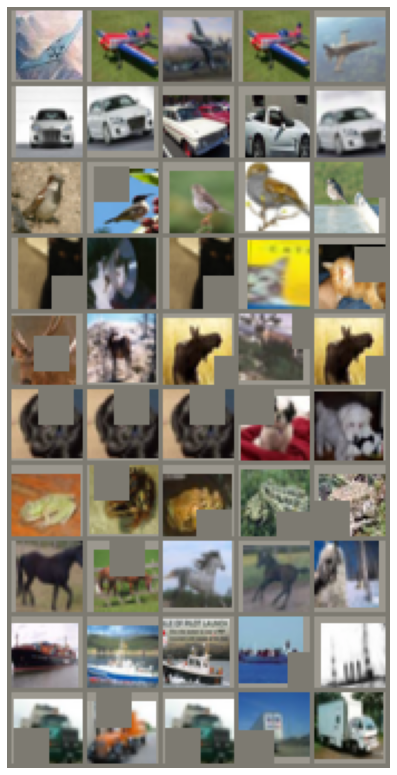

In [62]:
images, labels = next(iter(trainloader))
print(f'images.size() : {images.size()}, labels.size() : {labels.size()}')
num_classes = 10
num_images  = 5
fig_name    = 'Train_Images'
lst = []
for i in range(num_classes):
    idx = np.random.choice(np.where(labels[:]==i)[0], num_images)
    lst.extend(images[idx])
#disp_stack = torch.stack(lst, dim=0)
disp_grid = torchvision.utils.make_grid(lst, 5)
disp_grid1 = unnormalize(disp_grid)
tb_writer.add_image('Train-Images', disp_grid, 0)

fig = plt.figure(figsize=(14,14))
plt.imshow(disp_grid1)
plt.axis('off')
plt.savefig(f'{img_save_path}{fig_name}.jpg')

In [ ]:
%load_ext tensorboard 

In [23]:
#%tensorboard --logdir gdrive/MyDrive/EVA6P1_S8
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [90]:
## ResNet 18 model for training CIFAR10

class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.GroupNorm(1, planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.GroupNorm(1, planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes, kernel_size=1, stride=stride, bias=False),
                nn.GroupNorm(1, self.expansion*planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out
    
class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn1 = nn.GroupNorm(1, 64)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=1) # Modified from stride =2 to stride =1 to stop at 8x8 to train CIFAR-10
        self.Gap1   = nn.AdaptiveAvgPool2d(output_size=(1,1))
        self.fc     = nn.Conv2d(512*block.expansion, num_classes, kernel_size=1, stride = 1, padding=0, bias=False)
        
    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1]*(num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.Gap1(out)
        out = self.fc(out)
        out = out.view(out.size(0), -1)
        return F.log_softmax(out, dim=-1)
            
def ResNet18():
    return ResNet(BasicBlock, [2,2,2,2])

In [88]:
!pip install torchsummary
from torchsummary import summary

In [89]:
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
print(device)
model = ResNet18().to(device)
summary(model, input_size=(3, 32, 32))

cuda
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           1,728
         GroupNorm-2           [-1, 64, 32, 32]             128
            Conv2d-3           [-1, 64, 32, 32]          36,864
         GroupNorm-4           [-1, 64, 32, 32]             128
            Conv2d-5           [-1, 64, 32, 32]          36,864
         GroupNorm-6           [-1, 64, 32, 32]             128
        BasicBlock-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
         GroupNorm-9           [-1, 64, 32, 32]             128
           Conv2d-10           [-1, 64, 32, 32]          36,864
        GroupNorm-11           [-1, 64, 32, 32]             128
       BasicBlock-12           [-1, 64, 32, 32]               0
           Conv2d-13          [-1, 128, 16, 16]          73,728
        GroupNorm-14          [-1,

In [93]:
img = torch.ones(1, 3, 32, 32)
img = img.to(device)
tb_writer.add_graph(model, img)

In [92]:
class train_losses():
    def __init__(self, model, device, train_loader, train_stats, optimizer, total_epochs):
        self.model = model
        self.device = device
        self.train_loader = train_loader
        self.stats = train_stats
        self.optimizer = optimizer
        self.total_epochs = total_epochs

    def s6_train(self, current_epoch, scheduler, L1_factor=0):
        self.model.train()
        pbar = tqdm(self.train_loader)
        train_loss, correct, processed = 0, 0, 0
        for batch_idx, (data, target) in enumerate(pbar):
            data, target = data.to(self.device), target.to(self.device)
            self.optimizer.zero_grad()
            y_pred = self.model(data)
            train_loss = F.nll_loss(y_pred, target)

            # Updating train loss with L1 loss
            L1_Crit = nn.L1Loss(size_average=None, reduce=None, reduction='mean')
            reg_loss = 0
            for param in self.model.parameters():
                zero_vector = torch.rand_like(param) * 0
                reg_loss += L1_Crit(param, zero_vector)
            train_loss += L1_factor * reg_loss

            train_loss.backward()
            self.optimizer.step()

            lr = 0
            if scheduler and not (isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau)):
                lr = scheduler.get_last_lr()[0]   # Won't work for ReduceLRonPlateau
            else:
                lr = self.optimizer.param_groups[0]['lr']              

            pred = y_pred.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            processed += len(data)

            pbar.set_description(
                desc=f'Loss={train_loss.item()} Batch_id={batch_idx} Train Accuracy={100 * correct / processed:0.2f}')
            
            tb_writer.add_scalar('Train loss', round(train_loss.item(),4), global_step=current_epoch)

            #train_loss /= processed
            self.stats(round(train_loss.item(), 6), 'train_loss')

        train_acc = round((100. * correct / len(self.train_loader.dataset)), 2)
        self.stats(train_acc, 'train_acc')
        
        tb_writer.add_scalar('Acc/Train', train_acc, global_step=current_epoch)

        print(f'Train set: Epoch : {current_epoch}/{self.total_epochs} Train loss: {train_loss.item() :.4f}, Train Accuracy: {train_acc}')

    def s8_train(self, current_epoch, scheduler, L1_factor=0):
        self.model.train()
        pbar = tqdm(self.train_loader)
        train_loss, correct, processed = 0, 0, 0
        for batch_idx, (data, target) in enumerate(pbar):
            data, target = data.to(self.device), target.to(self.device)
            self.optimizer.zero_grad()
            y_pred = self.model(data)
            train_loss = F.nll_loss(y_pred, target)

            # Updating train loss with L1 loss
            L1_Crit = nn.L1Loss(size_average=None, reduce=None, reduction='mean')
            reg_loss = 0
            for param in self.model.parameters():
                zero_vector = torch.rand_like(param) * 0
                reg_loss += L1_Crit(param, zero_vector)
            train_loss += L1_factor * reg_loss

            train_loss.backward()
            self.optimizer.step()

            lr = 0
            if scheduler and not (isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau)):
                lr = scheduler.get_last_lr()[0]   # Won't work for ReduceLRonPlateau
            else:
                lr = self.optimizer.param_groups[0]['lr']              

            pred = y_pred.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()
            processed += len(data)

            pbar.set_description(
                desc=f'Loss={train_loss.item()} Batch_id={batch_idx} Train Accuracy={100 * correct / processed:0.2f}')
            
            tb_writer.add_scalar('Train loss', round(train_loss.item(),4), global_step=current_epoch)

            self.stats(round(train_loss.item(), 6), 'train_loss')

        train_acc = round((100. * correct / len(self.train_loader.dataset)), 2)
        self.stats(train_acc, 'train_acc')

        print(
            f'Train set: Epoch : {current_epoch}/{self.total_epochs} Average loss: {train_loss :.4f}, Train Accuracy: {train_acc}')        

In [91]:
class test_losses():
  def __init__(self, model, device, test_loader, test_stats, total_epochs):
      self.model        = model
      self.device       = device
      self.test_loader  = test_loader
      self.stats        = test_stats
      self.total_epochs = total_epochs

  def s6_test(self, current_epoch, scheduler, optimizer):
      self.model.eval()
      test_loss, correct, count_wrong = 0, 0, 0
      with torch.no_grad():
          for data, target in self.test_loader:
              data, target = data.to(self.device), target.to(self.device)
              output = self.model(data)
              test_loss += F.nll_loss(output, target, reduction='sum').item()  # sum up batch loss
              pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
              correct += pred.eq(target.view_as(pred)).sum().item()

              if current_epoch == (self.total_epochs - 1):
                  compare = pred.eq(target.view_as(pred))
                  misclass_idx = (compare == False).nonzero(as_tuple=True)[0].tolist()
                  for i in misclass_idx:
                      self.stats(data[i],'mis_img')
                      self.stats(pred[i].item(),'mis_pred')
                      self.stats(target[i].item(),'mis_lbl')

      test_loss /= len(self.test_loader.dataset)
      self.stats(round(test_loss,6), 'test_loss')
      test_acc = round((100. * correct / len(self.test_loader.dataset)), 2)
      self.stats(test_acc, 'test_acc')

      tb_writer.add_scalar('Test loss', round(test_loss,4), global_step=current_epoch)
      tb_writer.add_scalar('Acc/Test', test_acc, global_step=current_epoch)   

      #'scheduler.step' is required to update LR while using a scheduler like ReduceLROnPlateau. Here metric used is 'test_loss'
      scheduler.step(test_loss)   
               
      lr = 0 
      if scheduler and not isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
          lr = scheduler.get_last_lr()[0]           # Won't work for ReduceLROnPlateau
      else:
          lr = optimizer.param_groups[0]['lr']       

      print(f'Test set: Epoch : {current_epoch}/{self.total_epochs} Average loss: {test_loss :.4f}, Test Accuracy: {test_acc}')


  def s8_test(self, current_epoch,scheduler, optimizer):
      self.model.eval()
      test_loss, correct, count_wrong = 0, 0, 0
      with torch.no_grad():
          for data, target in self.test_loader:
              data, target = data.to(self.device), target.to(self.device)
              output = self.model(data)
              test_loss += F.nll_loss(output, target, reduction='sum').item()  # sum up batch loss
              pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
              correct += pred.eq(target.view_as(pred)).sum().item()

              if current_epoch == (self.total_epochs - 1):
                  compare = pred.eq(target.view_as(pred))
                  misclass_idx = (compare == False).nonzero(as_tuple=True)[0].tolist()
                  for i in misclass_idx:
                      self.stats(data[i],'mis_img')
                      self.stats(pred[i].item(),'mis_pred')
                      self.stats(target[i].item(),'mis_lbl')

      test_loss /= len(self.test_loader.dataset)
      self.stats(round(test_loss,6), 'test_loss')
      test_acc = round((100. * correct / len(self.test_loader.dataset)), 2)
      self.stats(test_acc, 'test_acc')

      tb_writer.add_scalar('Test loss', round(test_loss,4), global_step=current_epoch)
      tb_writer.add_scalar('Acc/Test', test_acc, global_step=current_epoch) 

      #'scheduler.step' is required to update LR while using a scheduler like ReduceLROnPlateau. Here metric used is 'test_loss'
      scheduler.step(test_loss)   
               
      lr = 0 
      if scheduler and not isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
          lr = scheduler.get_last_lr()[0]           # Won't work for ReduceLROnPlateau
      else:
          lr = optimizer.param_groups[0]['lr']            

      print(f'Test set: Epoch : {current_epoch}/{self.total_epochs} Average loss: {test_loss :.4f}, Test Accuracy: {test_acc}')      

In [94]:
global counters
counters = {'train_loss':[], 'train_acc':[], 'test_loss':[], 'test_acc':[], 'mis_img':[], 'mis_pred':[], 'mis_lbl':[]}

def ctr():    
    def inner(value, type):
        counters[type].append(value)
        return counters
    return inner

In [95]:
train_stats, test_stats = ctr(), ctr()

In [96]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

In [97]:
EPOCHS = 5
model = ResNet18().to(device)
optimizer = optim.SGD(model.parameters(), lr=0.025, momentum=0.8, weight_decay = 0)
#SCHEDULER = OneCycleLR(optimizer, max_lr=0.2, steps_per_epoch=len(trainloader), epochs=EPOCHS)
scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.1, min_lr=1e-7, patience = 4, verbose=True)
stats = ctr()
train = train_losses(model, device, trainloader, stats, optimizer, EPOCHS)
test  = test_losses(model, device, testloader, stats, EPOCHS)

for epoch in range(EPOCHS):
    print(f'EPOCH: {epoch}')
    train.s8_train(epoch, scheduler, L1_factor=0.0005)
    test.s8_test(epoch, scheduler, optimizer)

  0%|          | 0/391 [00:00<?, ?it/s]

EPOCH: 0


Loss=1.9077352285385132 Batch_id=390 Train Accuracy=17.36: 100%|██████████| 391/391 [01:07<00:00,  5.79it/s]

Train set: Epoch : 0/5 Average loss: 1.9077, Train Accuracy: 17.36



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 0/5 Average loss: 1.9892, Test Accuracy: 21.3
EPOCH: 1


Loss=1.789589762687683 Batch_id=390 Train Accuracy=30.11: 100%|██████████| 391/391 [01:09<00:00,  5.59it/s]

Train set: Epoch : 1/5 Average loss: 1.7896, Train Accuracy: 30.11



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 1/5 Average loss: 1.6273, Test Accuracy: 39.33
EPOCH: 2


Loss=1.5832953453063965 Batch_id=390 Train Accuracy=38.21: 100%|██████████| 391/391 [01:10<00:00,  5.58it/s]

Train set: Epoch : 2/5 Average loss: 1.5833, Train Accuracy: 38.21



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 2/5 Average loss: 1.4607, Test Accuracy: 45.45
EPOCH: 3


Loss=1.5714181661605835 Batch_id=390 Train Accuracy=43.75: 100%|██████████| 391/391 [01:10<00:00,  5.58it/s]

Train set: Epoch : 3/5 Average loss: 1.5714, Train Accuracy: 43.75



  0%|          | 0/391 [00:00<?, ?it/s]

Test set: Epoch : 3/5 Average loss: 1.2699, Test Accuracy: 53.29
EPOCH: 4


Loss=1.359561562538147 Batch_id=390 Train Accuracy=48.96: 100%|██████████| 391/391 [01:10<00:00,  5.58it/s]

Train set: Epoch : 4/5 Average loss: 1.3596, Train Accuracy: 48.96


Test set: Epoch : 4/5 Average loss: 1.2071, Test Accuracy: 55.53


In [98]:
class GradCAM:
    """ Class for extracting activations and 
    registering gradients from targetted intermediate layers 
    target_layers = list of convolution layer index as shown in summary
    """
    def __init__(self, model, candidate_layers=None):
        def save_fmaps(key):
          def forward_hook(module, input, output):
              self.fmap_pool[key] = output.detach()

          return forward_hook

        def save_grads(key):
          def backward_hook(module, grad_in, grad_out):
              self.grad_pool[key] = grad_out[0].detach()

          return backward_hook

        self.device = next(model.parameters()).device
        self.model = model
        self.handlers = []  # a set of hook function handlers
        self.fmap_pool = {}
        self.grad_pool = {}
        self.candidate_layers = candidate_layers  # list

        for name, module in self.model.named_modules():
            if self.candidate_layers is None or name in self.candidate_layers:
                self.handlers.append(module.register_forward_hook(save_fmaps(name)))
                self.handlers.append(module.register_backward_hook(save_grads(name)))

    def _encode_one_hot(self, ids):
        one_hot = torch.zeros_like(self.nll).to(self.device)
        one_hot.scatter_(1, ids, 1.0) # Refer https://yuyangyy.medium.com/understand-torch-scatter-b0fd6275331c to understand torch.scatter_
        return one_hot

    def forward(self, image):
        self.image_shape = image.shape[2:] # HxW
        self.nll = self.model(image)       # This will be a tensor have probabilties
        return self.nll.sort(dim=1, descending=True)  # ordered results, returns (values, indices)

    def backward(self, ids):
        """
        Class-specific backpropagation
        """
        one_hot = self._encode_one_hot(ids)
        self.model.zero_grad()
        self.nll.backward(gradient=one_hot, retain_graph=True)

    def remove_hook(self):
        """
        Remove all the forward/backward hook functions
        """
        for handle in self.handlers:
            handle.remove()

    def _find(self, pool, target_layer):
        if target_layer in pool.keys():
            return pool[target_layer]
        else:
            raise ValueError("Invalid layer name: {}".format(target_layer))

    def generate(self, target_layer):
        fmaps = self._find(self.fmap_pool, target_layer)
        grads = self._find(self.grad_pool, target_layer)
        weights = F.adaptive_avg_pool2d(grads, 1)

        gcam = torch.mul(fmaps, weights).sum(dim=1, keepdim=True)
        gcam = F.relu(gcam)
        # need to capture image size during forward pass
        gcam = F.interpolate(
            gcam, self.image_shape, mode="bilinear", align_corners=False
        )

        # scale output between 0,1
        B, C, H, W = gcam.shape
        gcam = gcam.view(B, -1)
        gcam -= gcam.min(dim=1, keepdim=True)[0]
        gcam /= gcam.max(dim=1, keepdim=True)[0]
        gcam = gcam.view(B, C, H, W)

        return gcam

def GRADCAM(images, labels, model, target_layers):
    model.eval()
    # map input to device
    images = torch.stack(images).to(device)
    # set up grad cam
    gcam = GradCAM(model, target_layers)
    # forward pass
    probs, ids = gcam.forward(images)
    # outputs against which to compute gradients
    ids_ = torch.LongTensor(labels).view(len(images),-1).to(device)
    # backward pass
    gcam.backward(ids=ids_)
    layers = []
    for i in range(len(target_layers)):
        target_layer = target_layers[i]
        print("Generating Grad-CAM @{}".format(target_layer))
        # Grad-CAM
        layers.append(gcam.generate(target_layer=target_layer))
    # remove hooks when done
    gcam.remove_hook()
    return layers, probs, ids

In [99]:
# Function to plot gradcam results for CIFAR10 of size (32, 32, 3)
def GRADCAM_PLOT(gcam_layers, images, labels, target_layers, predicted, disp_range):
    
    fig_name    = 'Gradcam_Imgs_'
    class_names = ['plane', 'automobile', 'bird', 'cat','deer', 'dog', 'frog', 'horse', 'ship', 'truck']
    image_size  = (3, 32, 32)
    a , b       = disp_range
    c = 6                                              # 6 columns - 1st : Display layer names, 2nd to 6th : To show 5 images
    r = len(target_layers) + 2                         # 6 rows    - 1st : Pred Vs act, 2nd: Input, 3rd: layer1, 4th: layer2, 5th: layer3, 6th: layer4
    fig = plt.figure(figsize=(16,12))    
    fig.subplots_adjust(hspace=0.01, wspace=0.01)
    ax = plt.subplot(r, c, 1)                          # (6 rows, 5 columns, Index = 1)
    ax.text(0.3,-0.5, f"Input \nImg {a+1}-{b}", fontsize=14)
    plt.axis('off')
    for i in range(len(target_layers)):
        target_layer = target_layers[i]
        ax = plt.subplot(r, c, c*(i+1)+1)
        ax.text(0.3,-0.5, target_layer, fontsize=14)
        plt.axis('off')

        for j in range(0,5):
            k = j + a
            img_ = images[k].cpu()
            img  = np.uint8(255*unnormalize(img_.view(image_size)))                             
            if i==0:
                ax = plt.subplot(r, c, j+2)
                ax.text(0.1, 0.2, f"pred={class_names[predicted[k][0]]}\nactual={class_names[labels[k]]}", fontsize=10)
                plt.axis('off')
                plt.subplot(r, c, c+j+2)
                plt.imshow(img, interpolation='bilinear')
                plt.axis('off')

            heatmap = gcam_layers[i][k].cpu().numpy()[0]
            heatmap = np.uint8(255 * heatmap)
            heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
            heatmap = heatmap[:, :, ::-1]
            superimposed_img = cv2.resize(cv2.addWeighted(img, 0.5, heatmap, 0.5, 0), (32,32))
            plt.subplot(r, c, (i+2)*c+j+2)
            plt.imshow(superimposed_img, interpolation='bilinear')
            plt.axis('off')
    plt.savefig(f'{img_save_path}{fig_name}{a}_{b}.jpg')       
    plt.show()     


In [100]:
images         = counters['mis_img'][1:21]
target_classes = counters['mis_lbl'][1:21]
target_layers  = ["layer1", "layer2", "layer3", "layer4"]
gradcam_output, probs, predicted_classes = GRADCAM(images, target_classes, model, target_layers)

Generating Grad-CAM @layer1
Generating Grad-CAM @layer2
Generating Grad-CAM @layer3
Generating Grad-CAM @layer4


/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py:974: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


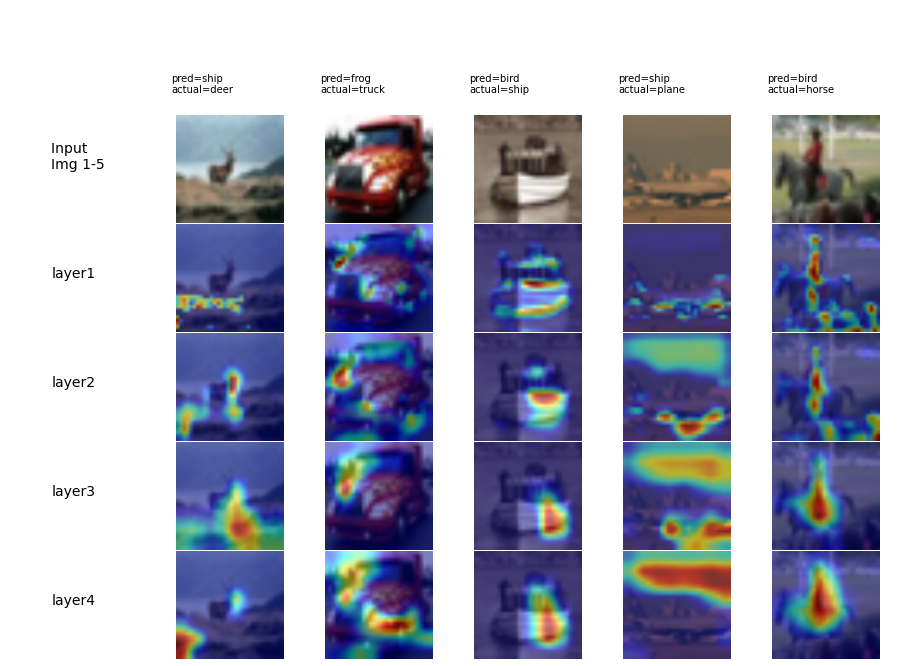

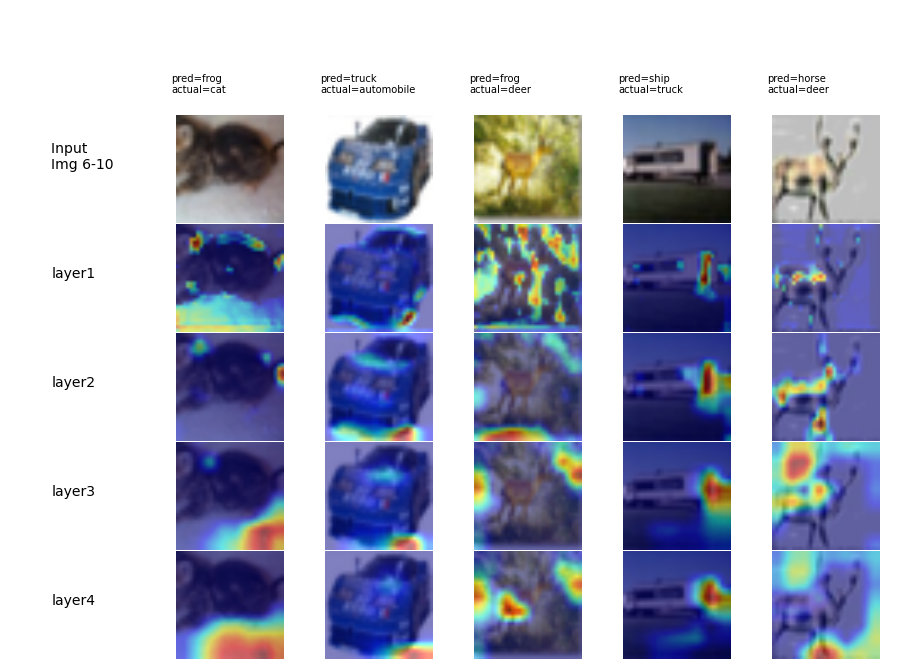

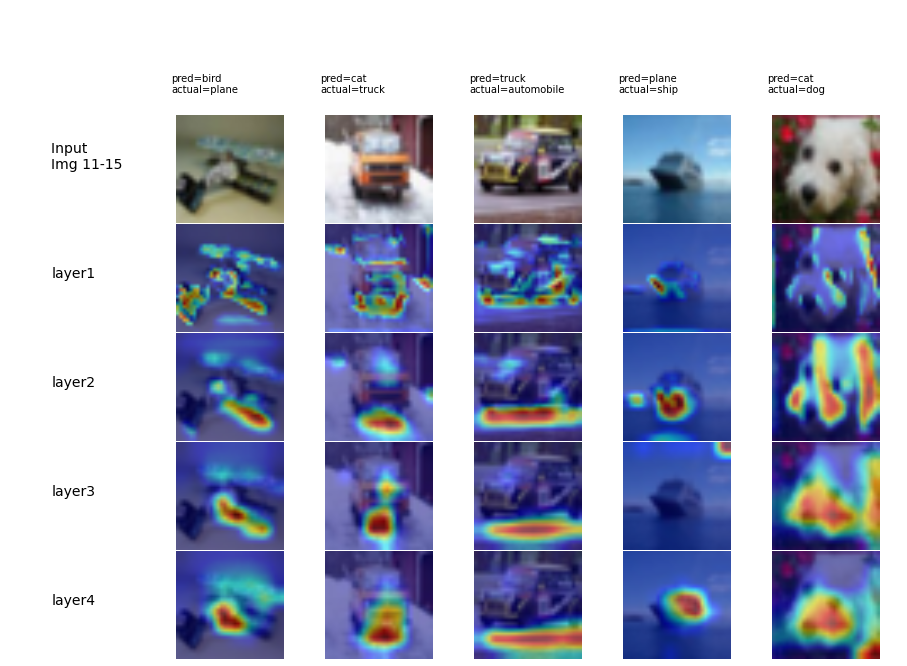

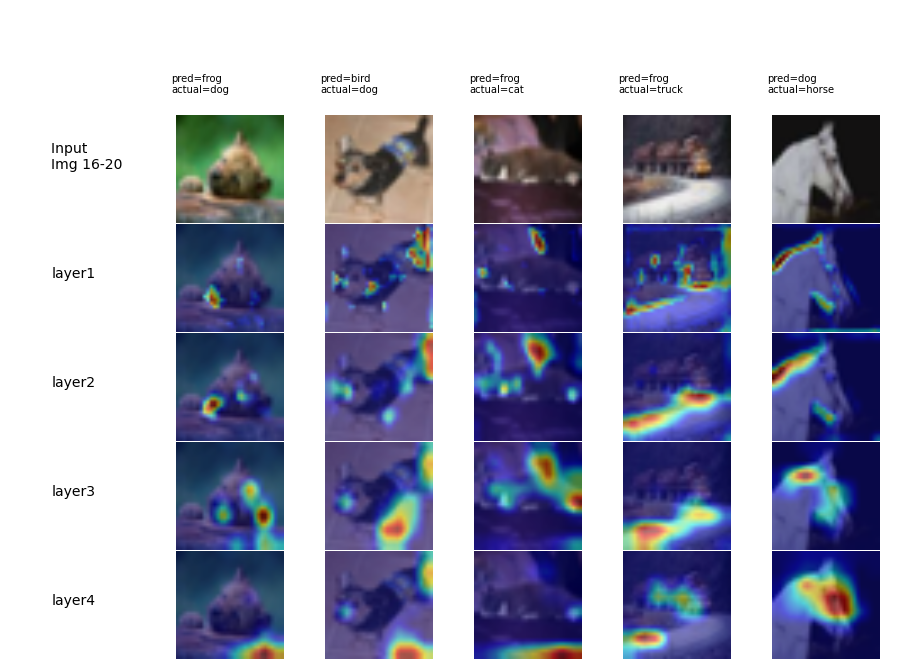

In [101]:
disp_grid = [(0,5), (5,10), (10, 15), (15,20)]
for disp_range in disp_grid:
    GRADCAM_PLOT(gradcam_output, images, target_classes, target_layers, predicted_classes, disp_range)

In [102]:
for disp_range in disp_grid:
    a, b = disp_range
    img_arr = plt.imread(f'{img_save_path}Gradcam_Imgs_{a}_{b}.jpg')
    img_arr = img_arr.transpose(2, 0, 1)
    tb_writer.add_image(f'GradCam-Images/Misclassified_Imgs_{a}_{b}', img_arr, 0)

In [103]:
def plot_misclassified(counters, num_images, title, class_names, fig_size):
    
    fig_name  = 'Test_Misclass_Imgs'
    figure=plt.figure(figsize=fig_size)
    print(f'** Plotting misclassified test images from last epoch for {title} **')
    print('\n')
    class_names_dict = class_names
    if len(counters['mis_img']) > num_images: 
        for i in range(num_images):
            plt.subplot(5,5,i+1)
            plt.axis(False)      
            unnorm_img = unnormalize(counters['mis_img'][i].cpu())
            plt.imshow(unnorm_img, interpolation='none')
            prediction = class_names_dict.get(counters['mis_pred'][i])
            actual     = class_names_dict.get(counters['mis_lbl'][i])
            s="pred="+str(prediction)+" act="+str(actual)
            plt.text(2,-1,s) 
        plt.savefig(f'{img_save_path}{fig_name}.jpg') 
        mis_arr = plt.imread(f'{img_save_path}{fig_name}.jpg') 
        mis_arr = mis_arr.transpose(2, 0, 1)
        tb_writer.add_image(f'Test-Misclassified_Imgs', mis_arr, 0)                              
    else:
        print(f'Unable to plot - Less than {num_images} images, only have {len(test_stats.img)} images')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


** Plotting misclassified test images from last epoch for CIFAR-10 **




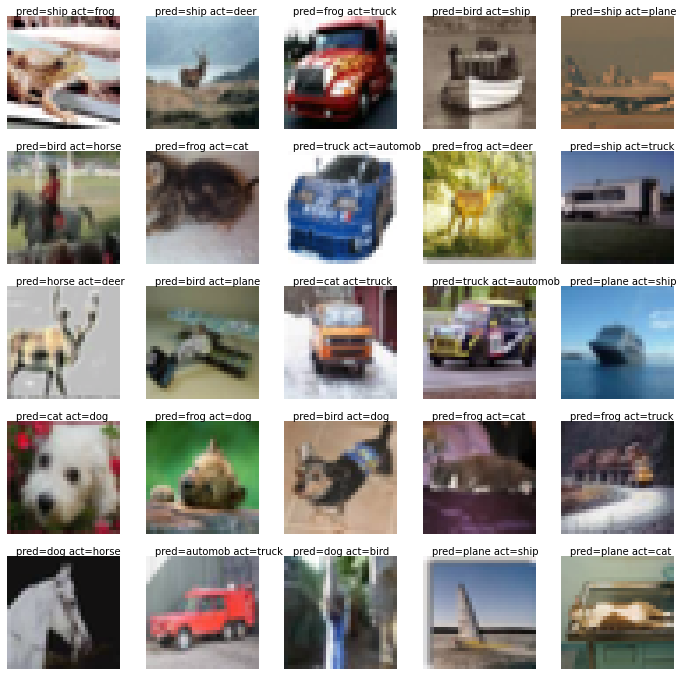

In [104]:
class_names_dict = {0:'plane', 1:'automob', 2:'bird', 3:'cat',4:'deer', 5:'dog', 6:'frog', 7:'horse', 8:'ship', 9:'truck'}
num_images       = 25
fig_size         = (12, 12)
title            = 'CIFAR-10'
misclass_stats   =  counters
plot_misclassified(misclass_stats, num_images, title, class_names_dict, fig_size)